In [1]:
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import pyarrow
from datetime import datetime
import simulations, utilities
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.cm as cm
import itertools
pv=!{sys.executable} --version
print(pv[0],'numpy ==', np.__version__, 'pyarrow ==',pyarrow.__version__, 'seaborn == ', sns.__version__)

Python 3.9.7 numpy == 1.20.3 pyarrow == 7.0.0 seaborn ==  0.11.2


In [2]:
# options
pd.set_option('display.max_columns', 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
mpl.rcParams['figure.dpi'] = 300
sns.set_style("ticks")
sns.set_palette("cubehelix")
font_scale = 3
sns.set_context("paper", font_scale=font_scale, rc={"lines.linewidth": 3, 'aspect':1})

In [4]:
def plot_agg(df, ci=None, title = None, legend=True, sharey=False, x='A', ys=['Economic Gini', 'Knowledge Gini',  'Economic Median', 'Knowledge Median'], 
style='N', hue='K'):
    sns.set_context("paper", font_scale=3, rc={"lines.linewidth": 3, 'aspect':1})
    n = len(ys)
    fig, axs = plt.subplots(nrows=1, ncols=n, sharey=sharey)
    fig.set_figwidth(40)
    fig.set_figheight(10)
    for i in range(n):
        ax=sns.lineplot( x=x, y=ys[i], style=style, hue=hue, ci=ci, data=df, legend=legend, ax=axs[i]);       
    if title:
        fig.suptitle(title, fontsize=16)

In [18]:
def plot_agg2(df, ci=None, title = None, legend=True, sharey=False, hue=None,
              x='Knowledge Gini',ys=['Economic Gini'], 
              col='K', style=None):
    sns.set_context("paper", font_scale=1.5, rc={"lines.linewidth": 2, 'aspect':1})
    n = len(ys)
    for i in range(n):
        
        sns.relplot(kind="line", x=x, y=ys[i], style=style, hue=hue, ci=ci, col=col, data=df.sort_values(by=x), legend=legend);       
        

    if title:
        fig.subtitle(title, fontsize=16)

In [3]:
data = pd.read_parquet('simulations.SimulationNK_main_agg.parquet')
print(data.shape)
print(data.columns)
data.head()

(26250, 21)
Index(['Configuration', 'Run', 'A', 'K', 'N', 'Companies', 'Economic Gini',
       'Economic Median', 'Economic Q1', 'Economic Q3', 'Exploration Effort',
       'Exploration Norms', 'Initial Economic Stock', 'Knowledge Gini',
       'Knowledge Median', 'Knowledge Q1', 'Knowledge Q3', 'Seed',
       'Simulation Size', 'Simulation Time', 'Time Step'],
      dtype='object')


,Configuration,Run,A,K,N,Companies,Economic Gini,Economic Median,Economic Q1,Economic Q3,Exploration Effort,Exploration Norms,Initial Economic Stock,Knowledge Gini,Knowledge Median,Knowledge Q1,Knowledge Q3,Seed,Simulation Size,Simulation Time,Time Step
0,0,0,0.600,1,2,100,0.860,0.000,0.000,7.500,0,0.100,100,0.197,0.494,0.494,0.846,0,100,50,50
1,0,1,0.600,1,2,100,0.894,0.000,0.000,4.250,0,0.100,100,0.247,0.295,0.295,0.744,1,100,50,50
2,0,2,0.600,1,2,100,0.757,0.000,0.000,20.000,0,0.100,100,0.167,0.625,0.518,0.671,2,100,50,50
3,0,3,0.600,1,2,100,0.831,0.000,0.000,262.250,0,0.100,100,0.144,0.550,0.505,0.813,3,100,50,50
4,0,4,0.600,1,2,100,0.972,0.000,0.000,0.000,0,0.100,100,0.381,0.384,0.039,0.540,4,100,50,50


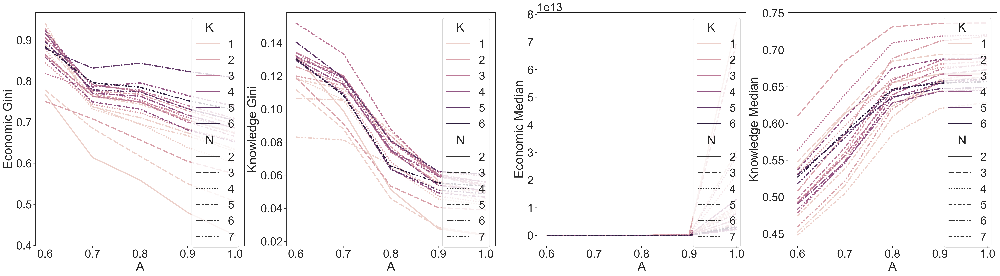

In [5]:
plot_agg(data)

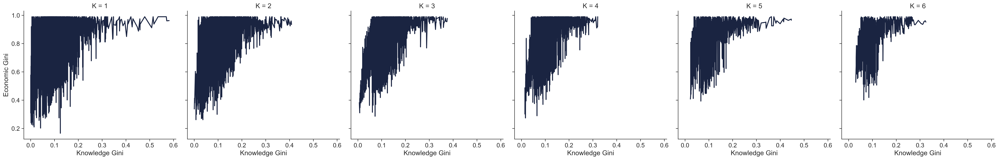

In [20]:
plot_agg2(data,  legend=True)

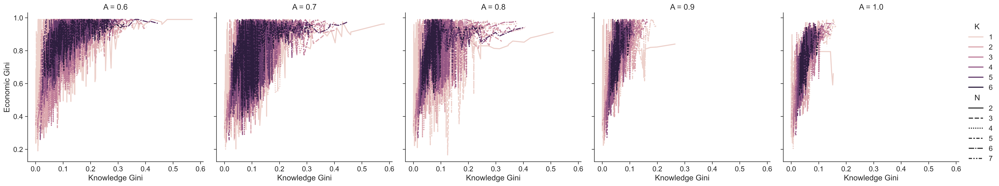

In [16]:
# plot the relationship between the two gini coefficients
sns.relplot(kind="line", x='Knowledge Gini', y='Economic Gini', style='N', hue='K', ci=None, col='A', data=data.sort_values(by='Knowledge Gini'), legend=True);

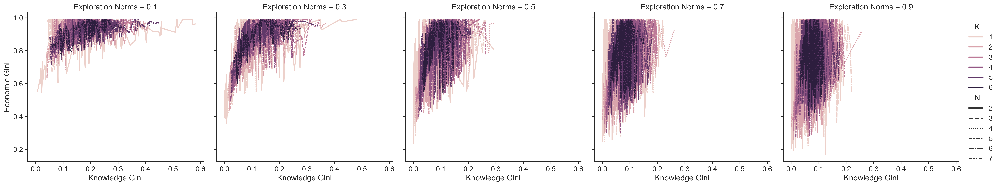

In [19]:
sns.relplot(kind="line", x='Knowledge Gini', y='Economic Gini', style='N', hue='K', ci=None, col='Exploration Norms', data=data.sort_values(by='Knowledge Gini'), legend=True);

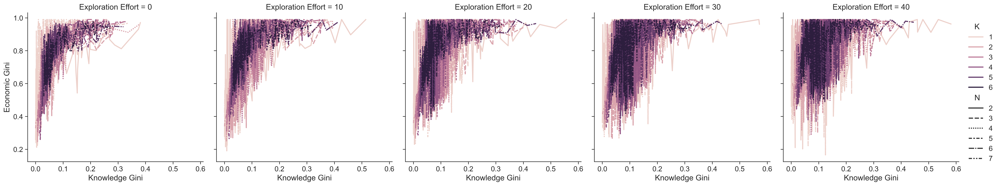

In [21]:
sns.relplot(kind="line", x='Knowledge Gini', y='Economic Gini', style='N', hue='K', ci=None, col='Exploration Effort', data=data.sort_values(by='Knowledge Gini'), legend=True);

Text(0.5, 0.92, 'Knowledge vs Economic Gini')

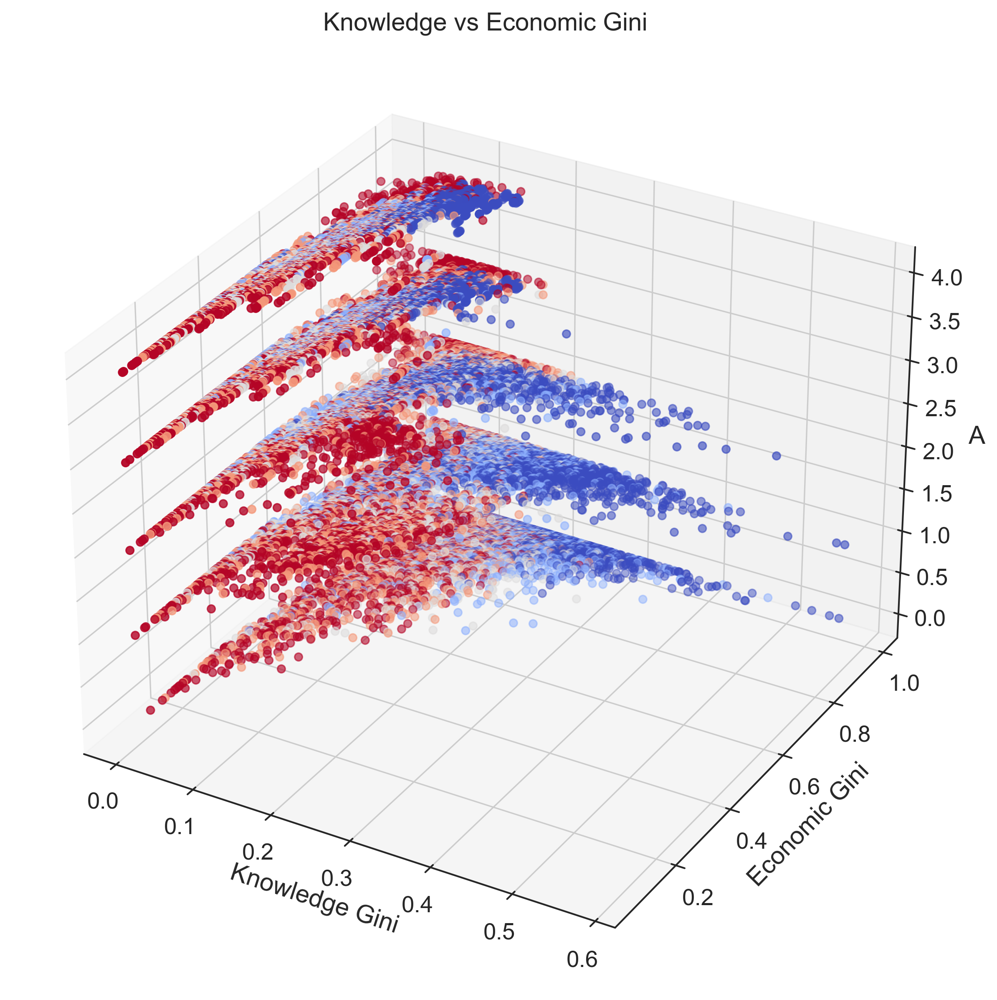

In [40]:
# create a 3d plot of the relationship between the two gini coefficients
df = data.copy()
df['Exploration Norms'] = df['Exploration Norms'].astype('category')
df['Exploration Effort'] = df['Exploration Effort'].astype('category')
df['N'] = df['N'].astype('category')
df['K'] = df['K'].astype('category')
df['A'] = df['A'].astype('category')

df['Exploration Norms'] = df['Exploration Norms'].cat.codes
df['Exploration Effort'] = df['Exploration Effort'].cat.codes
df['N'] = df['N'].cat.codes
df['K'] = df['K'].cat.codes
df['A'] = df['A'].cat.codes

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(  df['Knowledge Gini'],   df['Economic Gini'],df['A'], c=df['Exploration Norms'], cmap=cm.coolwarm, marker='o')
ax.set_xlabel('Knowledge Gini')
ax.set_ylabel('Economic Gini')
ax.set_zlabel('A')
ax.set_title('Knowledge vs Economic Gini')